## 方法说明

下面将整体处理流程用数学公式和符号详细说明，以帮助理解各个步骤的原理和实现过程。

---

## 1. 透视变换（Perspective Transformation）

### 正向变换

设原图中点为 $(x, y)$ ，目标（鸟瞰图）中的对应点为 $(x', y')$。透视变换矩阵为  
$$
M =
\begin{pmatrix}
m_{11} & m_{12} & m_{13} \\
m_{21} & m_{22} & m_{23} \\
m_{31} & m_{32} & m_{33}
\end{pmatrix}.
$$
它满足齐次坐标关系  
$$
\begin{bmatrix}
x'\\
y'\\
w
\end{bmatrix}
=
M \cdot
\begin{bmatrix}
x\\
y\\
1
\end{bmatrix}.
$$
归一化后有  
$$
x'_{\text{norm}} = \frac{x'}{w}, \quad y'_{\text{norm}} = \frac{y'}{w}.
$$
在代码中利用 $cv2.getPerspectiveTransform(src\_pts, dst\_pts)$ 计算得到 $M$，并通过 $cv2.warpPerspective$ 得到鸟瞰图。

### 反向变换

得到反透视矩阵  
$$
M^{-1} = \text{cv2.getPerspectiveTransform}(dst\_pts, src\_pts)
$$
用于将鸟瞰图上的点（如拟合曲线以及填充区域的多边形）转换回原图坐标，即满足  
$$
\begin{bmatrix}
x\\
y\\
w
\end{bmatrix}
=
M^{-1} \cdot
\begin{bmatrix}
x'\\
y'\\
1
\end{bmatrix}.
$$
归一化后得到原图中的点坐标  
$$
x_{\text{orig}} = \frac{x}{w}, \quad y_{\text{orig}} = \frac{y}{w}.
$$

---

## 2. 车道线像素提取及滑动窗口法（Lane Pixel Extraction via Sliding Windows）

给定在鸟瞰图的二值化白色区域（掩码）上，我们希望获得车道线上符合阈值的像素点集合  
$$
\{(x_i, y_i)\} \quad i=1,\dots, n.
$$
其主要步骤为：
1. 利用图像下半部分的水平累加直方图获取左右车道初始峰值，记为 $x_{peak}^{\text{left}}$ 与 $x_{peak}^{\text{right}}$。
2. 针对每个窗口（图像分成 $N$ 个高度相等的区域），在窗口中检测满足  
   $$
   x \in [x_{center} - \text{margin},\, x_{center} + \text{margin}]
   $$
   且 $y$ 在该窗口范围内的白色像素。若像素数量超过门限，则更新该窗口的中心 $x_{center}$ 为这些像素 $x$ 坐标的均值。

最终得到左右车道的像素点集合  
$$
\{(x^{\text{left}}_i, y^{\text{left}}_i)\} \quad \text{和} \quad \{(x^{\text{right}}_j, y^{\text{right}}_j)\}.
$$

---

## 3. 二次多项式拟合（Second-Order Polynomial Fitting）

对于检测到的左右车道像素点，分别使用二次多项式来拟合车道线。假设车道线满足下述形式：  
$$
x = a y^2 + b y + c.
$$
其中，$a,\,b,\, c$ 为待求系数。通过最小化残差平方和来拟合，即  
$$
\min_{a,\,b,\,c} \sum_{i} \left( x_i - (a y_i^2 + b y_i + c) \right)^2.
$$
利用 $\text{np.polyfit}(y, x, 2)$ 求得左侧与右侧车道的系数（分别记为 $a_{\text{left}}, b_{\text{left}}, c_{\text{left}}$ 及 $a_{\text{right}}, b_{\text{right}}, c_{\text{right}}$），那么对于任意 $y$：
$$
x_{\text{left}}(y) = a_{\text{left}} y^2 + b_{\text{left}} y + c_{\text{left}},
$$
$$
x_{\text{right}}(y) = a_{\text{right}} y^2 + b_{\text{right}} y + c_{\text{right}}.
$$

---

## 4. 构造填充区域及多边形的生成

为显示车道区域（特别是将左右拟合曲线之间的区域填充为透明浅绿色），我们构造闭合多边形。具体方法如下：

1. **定义填充区域的高度范围**：  
   令 $y_{\text{top}}$ 为检测到的左右车道像素中最小的 $y$ 值，即  
   $$
   y_{\text{top}} = \min\left(\min\{y^{\text{left}}_i\},\, \min\{y^{\text{right}}_j\}\right).
   $$
   底部 $y_{\text{bottom}}$ 则为图像高度（在鸟瞰图中为 $h-1$）。

2. **构造左右曲线上的点序列**：  
   对于从 $y_{\text{top}}$ 到 $y_{\text{bottom}}$ 的每个 $y$，计算对应的 $x$ 坐标：
   $$
   P_{\text{left}}(y) = \left(x_{\text{left}}(y),\, y \right), \quad P_{\text{right}}(y) = \left(x_{\text{right}}(y),\, y \right).
   $$
   构成两个点集 $L$（左侧点）和 $R$（右侧点）。

3. **形成闭合多边形**：  
   将 $L$ 的所有点按 $y$ 的递增顺序排列，再将 $R$ 按 $y$ 递减顺序排列，最终组合形成闭合多边形：
   $$
   P_{\text{poly}} = \{P_{\text{left}}(y_{\text{top}}),\, \dots,\, P_{\text{left}}(y_{\text{bottom}}),\, P_{\text{right}}(y_{\text{bottom}}),\, \dots,\, P_{\text{right}}(y_{\text{top}})\}.
   $$

---

## 5. 坐标变换及区域叠加

### 反透视变换多边形点

利用前面计算的反透视矩阵 $M^{-1}$，将多边形中的点从鸟瞰图坐标转换回原图坐标。对于每个点  
$$
\begin{bmatrix}
x'\\
y'\\
1
\end{bmatrix},
$$
有  
$$
\begin{bmatrix}
x\\
y\\
w
\end{bmatrix}
=
M^{-1} \cdot
\begin{bmatrix}
x'\\
y'\\
1
\end{bmatrix},
$$
归一化得到  
$$
\left(x_{\text{orig}}, y_{\text{orig}}\right) = \left(\frac{x}{w}, \frac{y}{w}\right).
$$

### 透明叠加

在原图上叠加透明区域，用透明系数 $\alpha$ 实现混合图像，公式为：  
$$
I_{\text{overlay}} = \alpha\, I_{\text{fill}} + (1-\alpha)\, I_{\text{orig}},
$$
其中 $I_{\text{fill}}$ 是用浅绿色填充的图像区域，$I_{\text{orig}}$ 为原图像。这种叠加方法可以用函数 `cv2.addWeighted` 实现。

此外，利用 `cv2.polylines` 在原图上绘制出左右拟合的曲线，分别为红色（左侧）和蓝色（右侧），以便直观显示车道线。

---

## 总结

整个处理流程可以用下面的公式流程图来概括：

1. **透视转换**  
   $$
   (x', y') \longleftarrow M \cdot (x, y, 1)^T
   $$
2. **车道像素提取**  
   $\{(x_i, y_i)\}$ 满足阈值条件
3. **二次多项式拟合**  
   $$
   x(y) = a\, y^2 + b\, y + c,\quad \min_{a,b,c} \sum_{i} \left( x_i - (a y_i^2 + b y_i + c) \right)^2
   $$
4. **构造多边形填充区域**  
   $$
   P_{\text{poly}} = \{P_{\text{left}}(y_{\text{top}} \ldots y_{\text{bottom}}), \, P_{\text{right}}(y_{\text{bottom}} \ldots y_{\text{top}})\}
   $$
5. **反透视变换回原图**  
   $$
   (x_{\text{orig}},y_{\text{orig}}) \longleftarrow M^{-1} \cdot (x', y', 1)^T
   $$
6. **图像融合**  
   $$
   I_{\text{overlay}} = \alpha\, I_{\text{fill}} + (1-\alpha)\, I_{\text{orig}}
   $$

通过以上数学描述，我们可以清晰地理解从原图到鸟瞰图的变换、车道线的检测与拟合、区域构造以及最终在原图上透明叠加车道区域的整个处理流程。

## 车道线检测成果图展示

### 下午-有前车遮挡效果

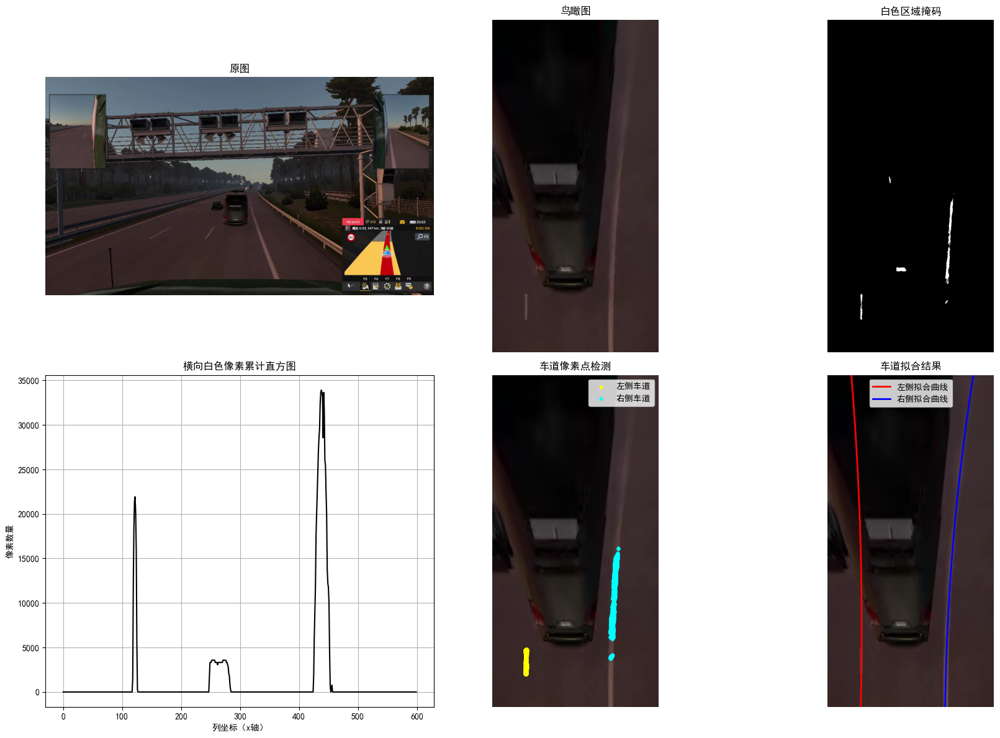

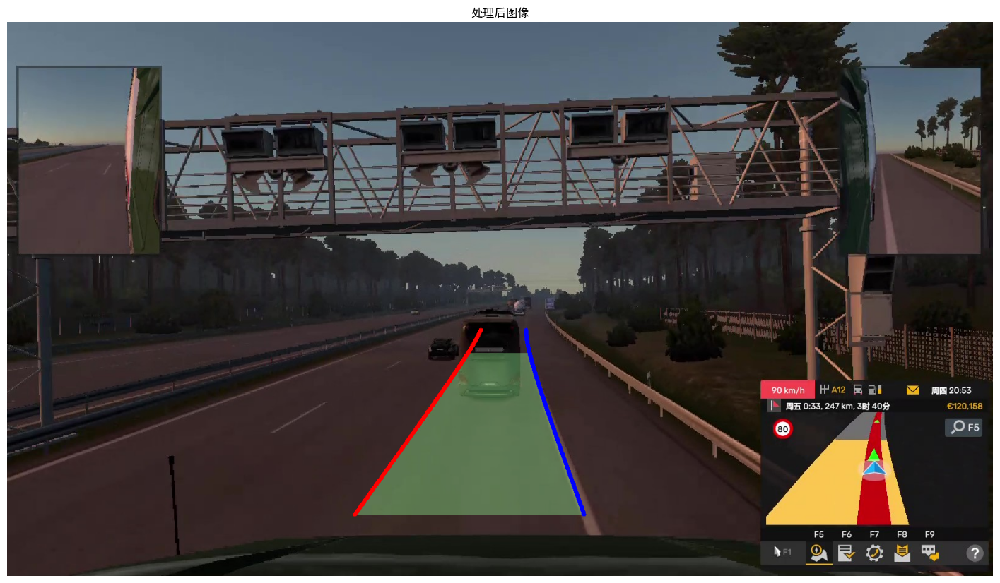

In [2]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置 matplotlib 支持中文和更大图像尺寸
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['figure.figsize'] = (18, 12)

# 1. 加载图像
img = cv2.imread('.\\test\\Euro Truck Simulator 2 2025-04-11 22-10-29 - frame at 1m11s.jpg')
# 转为 RGB 格式用于 matplotlib 显示
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. 定义透视变换区域（源点）
src_pts = np.float32([
    [755, 500],   # 左上角
    [855, 500],   # 右上角
    [1150, 800],  # 右下角
    [420, 800]    # 左下角
])

# 3. 目标区域的点（目标图尺寸：宽600，高1200）
width, height = 600, 1200
dst_pts = np.float32([
    [0, 0],             # 左上角
    [width - 1, 0],     # 右上角
    [width - 1, height - 1],  # 右下角
    [0, height - 1]     # 左下角
])

# 4. 计算透视变换矩阵并做变换
M = cv2.getPerspectiveTransform(src_pts, dst_pts)
bird_eye = cv2.warpPerspective(img, M, (width, height))
bird_eye_rgb = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2RGB)

# 5. 在鸟瞰图上提取白色区域（可根据实际情况调整 HSV 阈值）
hsv = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2HSV)
lower_white = np.array([0, 0, 85])
upper_white = np.array([180, 60, 255])
white_mask = cv2.inRange(hsv, lower_white, upper_white)

# 6. 定义滑动窗口检测车道像素点的函数（针对虚线，将阈值调整为30）
def seekLane(binary_image, lane_peak_x, sliding_window_num=9, margin=100, min_pixels_threshold=30):
    """
    输入：
        binary_image: 二值化图像（例如白色区域掩码）
        lane_peak_x: 车道起始的峰值 x 坐标（直方图得到）
        sliding_window_num: 将图像划分的窗口数量（自下而上）
        margin: 窗口宽度一半
        min_pixels_threshold: 窗口内重新定位中心的最少像素数
    输出：
        lane_x, lane_y: 车道线上所有白色像素的 x 和 y 坐标
    """
    h, w = binary_image.shape
    nonzero = binary_image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    window_center = lane_peak_x
    sliding_window_height = h // sliding_window_num
    lane_pixel_indexes = []
    
    for i in range(sliding_window_num):
        window_top = h - (i + 1) * sliding_window_height
        window_bottom = h - i * sliding_window_height
        window_left = int(window_center - margin)
        window_right = int(window_center + margin)
        
        window_pixel_indices = ((nonzero_y >= window_top) & (nonzero_y < window_bottom) &
                                (nonzero_x >= window_left) & (nonzero_x < window_right)).nonzero()[0]
        lane_pixel_indexes.append(window_pixel_indices)
        
        # 如果当前窗口内像素数大于设定阈值，则更新窗口中心（取质心）
        if len(window_pixel_indices) > min_pixels_threshold:
            window_center = int(np.mean(nonzero_x[window_pixel_indices]))
    
    if len(lane_pixel_indexes) > 0:
        lane_pixel_indexes = np.concatenate(lane_pixel_indexes)
    else:
        lane_pixel_indexes = np.array([])
    
    lane_x = nonzero_x[lane_pixel_indexes]
    lane_y = nonzero_y[lane_pixel_indexes]
    
    return lane_x, lane_y

# 7. 利用直方图确定左右车道线的初始峰值
histogram = np.sum(white_mask[white_mask.shape[0] // 2:, :], axis=0)
midpoint = histogram.shape[0] // 2
left_lane_peak = np.argmax(histogram[:midpoint])
right_lane_peak = np.argmax(histogram[midpoint:]) + midpoint

# 分别检测左右车道线像素
left_lane_x, left_lane_y = seekLane(white_mask, left_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)
right_lane_x, right_lane_y = seekLane(white_mask, right_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)

# 8. 对左右车道线分别进行二次多项式拟合（以 y 作为自变量，x 为因变量）
plot_y = np.linspace(0, height - 1, height)
left_fit_x, right_fit_x = None, None
if len(left_lane_y) > 0 and len(left_lane_x) > 0:
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fit_poly = np.poly1d(left_fit)
    left_fit_x = left_fit_poly(plot_y)
if len(right_lane_y) > 0 and len(right_lane_x) > 0:
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fit_poly = np.poly1d(right_fit)
    right_fit_x = right_fit_poly(plot_y)

# 9. 将6张图展示在一个2x3的图中
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 子图1：原图
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("原图")
axes[0, 0].axis('off')

# 子图2：鸟瞰图
axes[0, 1].imshow(bird_eye_rgb)
axes[0, 1].set_title("鸟瞰图")
axes[0, 1].axis('off')

# 子图3：白色区域掩码
axes[0, 2].imshow(white_mask, cmap='gray')
axes[0, 2].set_title("白色区域掩码")
axes[0, 2].axis('off')

# 子图4：横向白色像素累计直方图
axes[1, 0].plot(histogram, color='black')
axes[1, 0].set_title("横向白色像素累计直方图")
axes[1, 0].set_xlabel("列坐标（x轴）")
axes[1, 0].set_ylabel("像素数量")
axes[1, 0].grid(True)

# 子图5：车道像素点检测（左右）
axes[1, 1].imshow(bird_eye_rgb)
axes[1, 1].scatter(left_lane_x, left_lane_y, s=10, color='yellow', label='左侧车道')
axes[1, 1].scatter(right_lane_x, right_lane_y, s=10, color='cyan', label='右侧车道')
axes[1, 1].set_title("车道像素点检测")
axes[1, 1].legend()
axes[1, 1].axis('off')

# 子图6：车道拟合结果
axes[1, 2].imshow(bird_eye_rgb)
if left_fit_x is not None:
    axes[1, 2].plot(left_fit_x, plot_y, color='red', linewidth=2, label='左侧拟合曲线')
if right_fit_x is not None:
    axes[1, 2].plot(right_fit_x, plot_y, color='blue', linewidth=2, label='右侧拟合曲线')
axes[1, 2].set_title("车道拟合结果")
axes[1, 2].legend()
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

###############################################################################
# --- 以下代码实现将拟合曲线及两曲线中间的区域（到提取的车道像素最高处）叠加到原图上 ---
###############################################################################

# 10. 计算反透视矩阵（从鸟瞰图到原图）
Minv = cv2.getPerspectiveTransform(dst_pts, src_pts)

# 11. 确定填充区域的上边界：
# 如果左右车道都提取到了像素点，则取二者中 y 值最小的（图中位置最高）
if left_lane_y.size > 0 and right_lane_y.size > 0 and left_fit_x is not None and right_fit_x is not None:
    y_top_candidate = min(np.min(left_lane_y), np.min(right_lane_y))
    y_fill_top = int(y_top_candidate)
else:
    # 若某一侧检测失败，则全幅填充（或者自行设定一个阈值）
    y_fill_top = 0

# 12. 在鸟瞰图中构造用于填充区域的多边形：
# 取 y 从 y_fill_top 到底部的区域
fill_y = np.arange(y_fill_top, height)
if left_fit_x is not None:
    left_x_fill = left_fit_poly(fill_y)
if right_fit_x is not None:
    right_x_fill = right_fit_poly(fill_y)

# 左侧曲线点（按 y 从上到下排列）
left_points = np.column_stack((left_x_fill, fill_y))
# 右侧曲线点（按 y 从上到下排列），为了构成闭合多边形，将其翻转
right_points = np.column_stack((right_x_fill, fill_y))[::-1]
# 合并两侧点，构成闭合多边形
polygon_points_be = np.vstack((left_points, right_points))
# 转换为适用于 cv2.perspectiveTransform 的格式
polygon_points_be = polygon_points_be.astype(np.float32).reshape(-1, 1, 2)

# 13. 将多边形区域的点由鸟瞰图坐标转换回原图坐标
polygon_points_orig = cv2.perspectiveTransform(polygon_points_be, Minv)
polygon_points_orig = np.int32(polygon_points_orig)

# 14. 同理，将整条拟合曲线转换到原图：
# 构造整条曲线的点（鸟瞰图坐标下），使用之前的 plot_y 及拟合曲线数据
if left_fit_x is not None:
    left_curve_be = np.column_stack((left_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    left_curve_orig = cv2.perspectiveTransform(left_curve_be, Minv)
    left_curve_orig = left_curve_orig.astype(np.int32)
if right_fit_x is not None:
    right_curve_be = np.column_stack((right_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    right_curve_orig = cv2.perspectiveTransform(right_curve_be, Minv)
    right_curve_orig = right_curve_orig.astype(np.int32)

# 15. 在原图上叠加透明填充和拟合曲线：
# 复制原图用于绘制
img_overlay = img_rgb.copy()

# 创建一个 overlay，用于绘制透明区域
overlay = img_overlay.copy()
alpha = 0.4  # 设置透明度

# 填充多边形区域为透明浅绿色（此处颜色为 (144,238,144) 可根据需要调整）
cv2.fillPoly(overlay, [polygon_points_orig], (144, 238, 144))
# 将 overlay 叠加到原图上
img_overlay = cv2.addWeighted(overlay, alpha, img_overlay, 1 - alpha, 0)

# 绘制左右拟合曲线
if left_fit_x is not None:
    cv2.polylines(img_overlay, [left_curve_orig], isClosed=False, color=(255, 0, 0), thickness=5)
if right_fit_x is not None:
    cv2.polylines(img_overlay, [right_curve_orig], isClosed=False, color=(0, 0, 255), thickness=5)

# 16. 在新窗口中显示结果（原图上叠加了拟合曲线和车道区域）
plt.figure(figsize=(18, 12))
plt.imshow(img_overlay)
plt.title("处理后图像")
plt.axis('off')
plt.show()

### 有车辆-下午-接近弯道

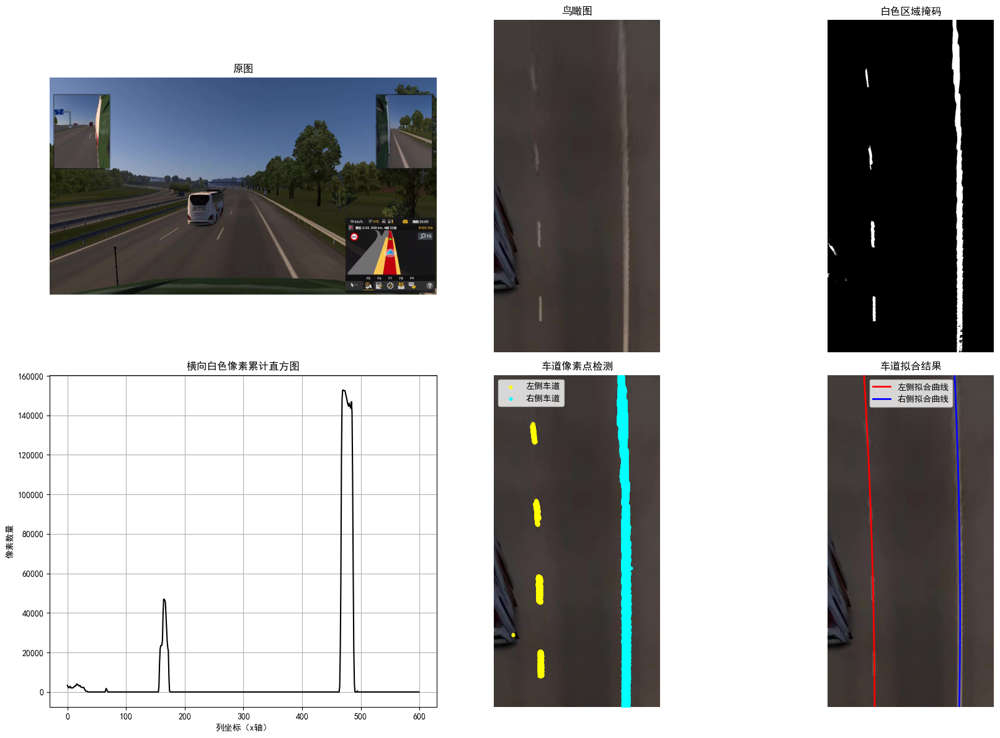

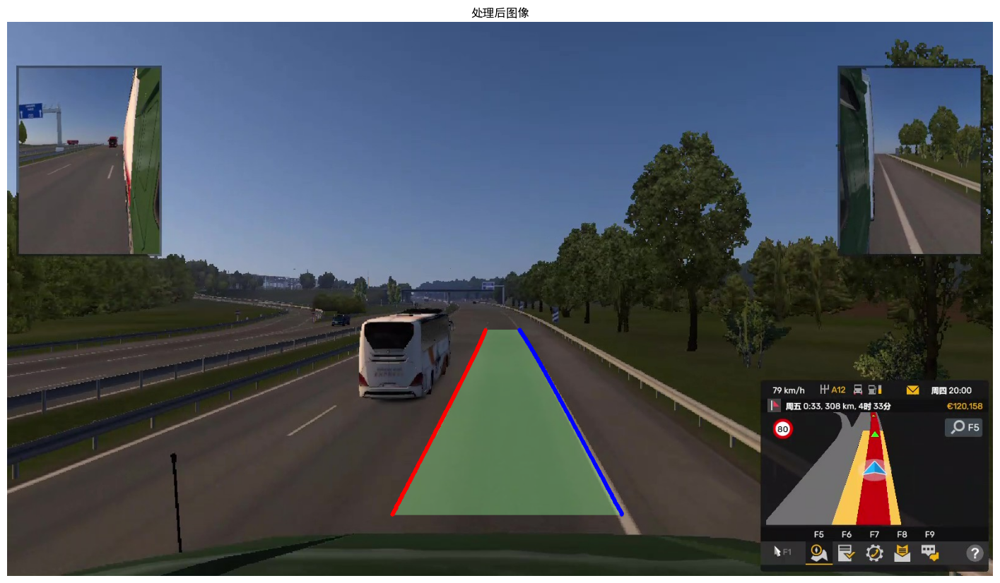

In [9]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置 matplotlib 支持中文和更大图像尺寸
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['figure.figsize'] = (18, 12)

# 1. 加载图像
img = cv2.imread('.\\test\\Euro Truck Simulator 2 2025-04-09 22-28-16 - frame at 0m46s.jpg')
# 转为 RGB 格式用于 matplotlib 显示
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. 定义透视变换区域（源点）
src_pts = np.float32([
    [755, 500],   # 左上角
    [855, 500],   # 右上角
    [1150, 800],  # 右下角
    [420, 800]    # 左下角
])

# 3. 目标区域的点（目标图尺寸：宽600，高1200）
width, height = 600, 1200
dst_pts = np.float32([
    [0, 0],             # 左上角
    [width - 1, 0],     # 右上角
    [width - 1, height - 1],  # 右下角
    [0, height - 1]     # 左下角
])

# 4. 计算透视变换矩阵并做变换
M = cv2.getPerspectiveTransform(src_pts, dst_pts)
bird_eye = cv2.warpPerspective(img, M, (width, height))
bird_eye_rgb = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2RGB)

# 5. 在鸟瞰图上提取白色区域（可根据实际情况调整 HSV 阈值）
hsv = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2HSV)
lower_white = np.array([0, 0, 85])
upper_white = np.array([180, 60, 255])
white_mask = cv2.inRange(hsv, lower_white, upper_white)

# 6. 定义滑动窗口检测车道像素点的函数（针对虚线，将阈值调整为30）
def seekLane(binary_image, lane_peak_x, sliding_window_num=9, margin=100, min_pixels_threshold=30):
    """
    输入：
        binary_image: 二值化图像（例如白色区域掩码）
        lane_peak_x: 车道起始的峰值 x 坐标（直方图得到）
        sliding_window_num: 将图像划分的窗口数量（自下而上）
        margin: 窗口宽度一半
        min_pixels_threshold: 窗口内重新定位中心的最少像素数
    输出：
        lane_x, lane_y: 车道线上所有白色像素的 x 和 y 坐标
    """
    h, w = binary_image.shape
    nonzero = binary_image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    window_center = lane_peak_x
    sliding_window_height = h // sliding_window_num
    lane_pixel_indexes = []
    
    for i in range(sliding_window_num):
        window_top = h - (i + 1) * sliding_window_height
        window_bottom = h - i * sliding_window_height
        window_left = int(window_center - margin)
        window_right = int(window_center + margin)
        
        window_pixel_indices = ((nonzero_y >= window_top) & (nonzero_y < window_bottom) &
                                (nonzero_x >= window_left) & (nonzero_x < window_right)).nonzero()[0]
        lane_pixel_indexes.append(window_pixel_indices)
        
        # 如果当前窗口内像素数大于设定阈值，则更新窗口中心（取质心）
        if len(window_pixel_indices) > min_pixels_threshold:
            window_center = int(np.mean(nonzero_x[window_pixel_indices]))
    
    if len(lane_pixel_indexes) > 0:
        lane_pixel_indexes = np.concatenate(lane_pixel_indexes)
    else:
        lane_pixel_indexes = np.array([])
    
    lane_x = nonzero_x[lane_pixel_indexes]
    lane_y = nonzero_y[lane_pixel_indexes]
    
    return lane_x, lane_y

# 7. 利用直方图确定左右车道线的初始峰值
histogram = np.sum(white_mask[white_mask.shape[0] // 2:, :], axis=0)
midpoint = histogram.shape[0] // 2
left_lane_peak = np.argmax(histogram[:midpoint])
right_lane_peak = np.argmax(histogram[midpoint:]) + midpoint

# 分别检测左右车道线像素
left_lane_x, left_lane_y = seekLane(white_mask, left_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)
right_lane_x, right_lane_y = seekLane(white_mask, right_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)

# 8. 对左右车道线分别进行二次多项式拟合（以 y 作为自变量，x 为因变量）
plot_y = np.linspace(0, height - 1, height)
left_fit_x, right_fit_x = None, None
if len(left_lane_y) > 0 and len(left_lane_x) > 0:
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fit_poly = np.poly1d(left_fit)
    left_fit_x = left_fit_poly(plot_y)
if len(right_lane_y) > 0 and len(right_lane_x) > 0:
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fit_poly = np.poly1d(right_fit)
    right_fit_x = right_fit_poly(plot_y)

# 9. 将6张图展示在一个2x3的图中
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 子图1：原图
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("原图")
axes[0, 0].axis('off')

# 子图2：鸟瞰图
axes[0, 1].imshow(bird_eye_rgb)
axes[0, 1].set_title("鸟瞰图")
axes[0, 1].axis('off')

# 子图3：白色区域掩码
axes[0, 2].imshow(white_mask, cmap='gray')
axes[0, 2].set_title("白色区域掩码")
axes[0, 2].axis('off')

# 子图4：横向白色像素累计直方图
axes[1, 0].plot(histogram, color='black')
axes[1, 0].set_title("横向白色像素累计直方图")
axes[1, 0].set_xlabel("列坐标（x轴）")
axes[1, 0].set_ylabel("像素数量")
axes[1, 0].grid(True)

# 子图5：车道像素点检测（左右）
axes[1, 1].imshow(bird_eye_rgb)
axes[1, 1].scatter(left_lane_x, left_lane_y, s=10, color='yellow', label='左侧车道')
axes[1, 1].scatter(right_lane_x, right_lane_y, s=10, color='cyan', label='右侧车道')
axes[1, 1].set_title("车道像素点检测")
axes[1, 1].legend()
axes[1, 1].axis('off')

# 子图6：车道拟合结果
axes[1, 2].imshow(bird_eye_rgb)
if left_fit_x is not None:
    axes[1, 2].plot(left_fit_x, plot_y, color='red', linewidth=2, label='左侧拟合曲线')
if right_fit_x is not None:
    axes[1, 2].plot(right_fit_x, plot_y, color='blue', linewidth=2, label='右侧拟合曲线')
axes[1, 2].set_title("车道拟合结果")
axes[1, 2].legend()
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

###############################################################################
# --- 以下代码实现将拟合曲线及两曲线中间的区域（到提取的车道像素最高处）叠加到原图上 ---
###############################################################################

# 10. 计算反透视矩阵（从鸟瞰图到原图）
Minv = cv2.getPerspectiveTransform(dst_pts, src_pts)

# 11. 确定填充区域的上边界：
# 如果左右车道都提取到了像素点，则取二者中 y 值最小的（图中位置最高）
if left_lane_y.size > 0 and right_lane_y.size > 0 and left_fit_x is not None and right_fit_x is not None:
    y_top_candidate = min(np.min(left_lane_y), np.min(right_lane_y))
    y_fill_top = int(y_top_candidate)
else:
    # 若某一侧检测失败，则全幅填充（或者自行设定一个阈值）
    y_fill_top = 0

# 12. 在鸟瞰图中构造用于填充区域的多边形：
# 取 y 从 y_fill_top 到底部的区域
fill_y = np.arange(y_fill_top, height)
if left_fit_x is not None:
    left_x_fill = left_fit_poly(fill_y)
if right_fit_x is not None:
    right_x_fill = right_fit_poly(fill_y)

# 左侧曲线点（按 y 从上到下排列）
left_points = np.column_stack((left_x_fill, fill_y))
# 右侧曲线点（按 y 从上到下排列），为了构成闭合多边形，将其翻转
right_points = np.column_stack((right_x_fill, fill_y))[::-1]
# 合并两侧点，构成闭合多边形
polygon_points_be = np.vstack((left_points, right_points))
# 转换为适用于 cv2.perspectiveTransform 的格式
polygon_points_be = polygon_points_be.astype(np.float32).reshape(-1, 1, 2)

# 13. 将多边形区域的点由鸟瞰图坐标转换回原图坐标
polygon_points_orig = cv2.perspectiveTransform(polygon_points_be, Minv)
polygon_points_orig = np.int32(polygon_points_orig)

# 14. 同理，将整条拟合曲线转换到原图：
# 构造整条曲线的点（鸟瞰图坐标下），使用之前的 plot_y 及拟合曲线数据
if left_fit_x is not None:
    left_curve_be = np.column_stack((left_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    left_curve_orig = cv2.perspectiveTransform(left_curve_be, Minv)
    left_curve_orig = left_curve_orig.astype(np.int32)
if right_fit_x is not None:
    right_curve_be = np.column_stack((right_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    right_curve_orig = cv2.perspectiveTransform(right_curve_be, Minv)
    right_curve_orig = right_curve_orig.astype(np.int32)

# 15. 在原图上叠加透明填充和拟合曲线：
# 复制原图用于绘制
img_overlay = img_rgb.copy()

# 创建一个 overlay，用于绘制透明区域
overlay = img_overlay.copy()
alpha = 0.4  # 设置透明度

# 填充多边形区域为透明浅绿色（此处颜色为 (144,238,144) 可根据需要调整）
cv2.fillPoly(overlay, [polygon_points_orig], (144, 238, 144))
# 将 overlay 叠加到原图上
img_overlay = cv2.addWeighted(overlay, alpha, img_overlay, 1 - alpha, 0)

# 绘制左右拟合曲线
if left_fit_x is not None:
    cv2.polylines(img_overlay, [left_curve_orig], isClosed=False, color=(255, 0, 0), thickness=5)
if right_fit_x is not None:
    cv2.polylines(img_overlay, [right_curve_orig], isClosed=False, color=(0, 0, 255), thickness=5)

# 16. 在新窗口中显示结果（原图上叠加了拟合曲线和车道区域）
plt.figure(figsize=(18, 12))
plt.imshow(img_overlay)
plt.title("处理后图像")
plt.axis('off')
plt.show()

### 白天-弯道-旁边有车辆

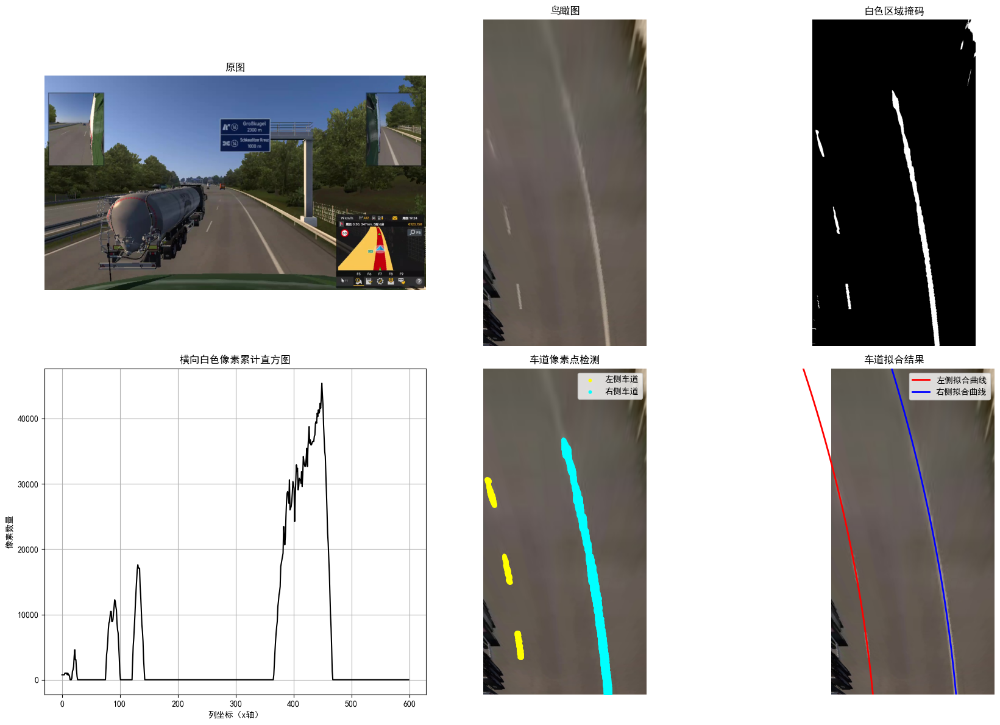

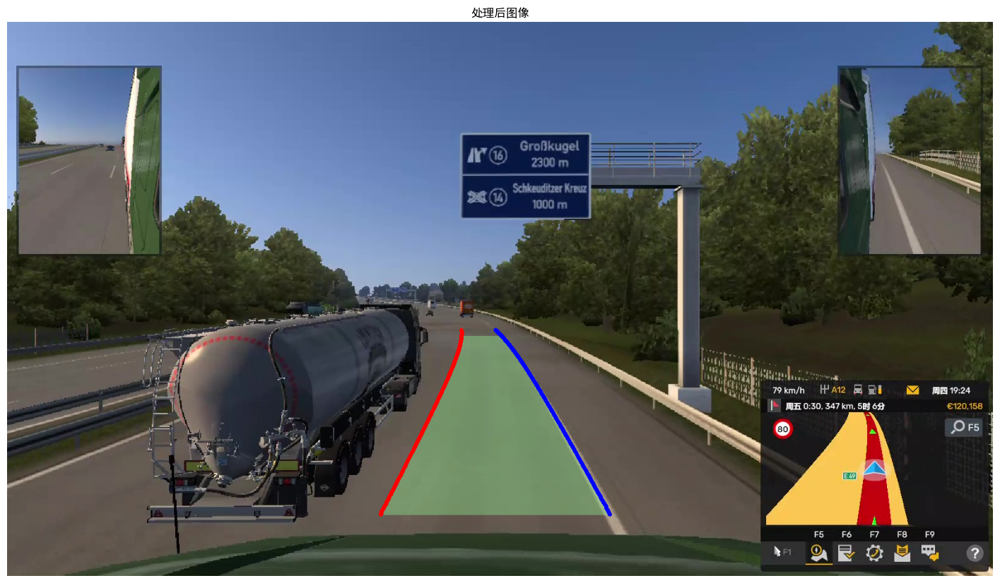

In [11]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置 matplotlib 支持中文和更大图像尺寸
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['figure.figsize'] = (18, 12)

# 1. 加载图像
img = cv2.imread('.\\test\\Euro Truck Simulator 2 2025-04-09 22-25-50 - frame at 1m7s.jpg')
# 转为 RGB 格式用于 matplotlib 显示
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. 定义透视变换区域（源点）
src_pts = np.float32([
    [755, 500],   # 左上角
    [855, 500],   # 右上角
    [1150, 800],  # 右下角
    [420, 800]    # 左下角
])

# 3. 目标区域的点（目标图尺寸：宽600，高1200）
width, height = 600, 1200
dst_pts = np.float32([
    [0, 0],             # 左上角
    [width - 1, 0],     # 右上角
    [width - 1, height - 1],  # 右下角
    [0, height - 1]     # 左下角
])

# 4. 计算透视变换矩阵并做变换
M = cv2.getPerspectiveTransform(src_pts, dst_pts)
bird_eye = cv2.warpPerspective(img, M, (width, height))
bird_eye_rgb = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2RGB)

# 5. 在鸟瞰图上提取白色区域（可根据实际情况调整 HSV 阈值）
hsv = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2HSV)
lower_white = np.array([0, 0, 120])
upper_white = np.array([180, 60, 255])
white_mask = cv2.inRange(hsv, lower_white, upper_white)

# 6. 定义滑动窗口检测车道像素点的函数（针对虚线，将阈值调整为30）
def seekLane(binary_image, lane_peak_x, sliding_window_num=9, margin=100, min_pixels_threshold=30):
    """
    输入：
        binary_image: 二值化图像（例如白色区域掩码）
        lane_peak_x: 车道起始的峰值 x 坐标（直方图得到）
        sliding_window_num: 将图像划分的窗口数量（自下而上）
        margin: 窗口宽度一半
        min_pixels_threshold: 窗口内重新定位中心的最少像素数
    输出：
        lane_x, lane_y: 车道线上所有白色像素的 x 和 y 坐标
    """
    h, w = binary_image.shape
    nonzero = binary_image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    window_center = lane_peak_x
    sliding_window_height = h // sliding_window_num
    lane_pixel_indexes = []
    
    for i in range(sliding_window_num):
        window_top = h - (i + 1) * sliding_window_height
        window_bottom = h - i * sliding_window_height
        window_left = int(window_center - margin)
        window_right = int(window_center + margin)
        
        window_pixel_indices = ((nonzero_y >= window_top) & (nonzero_y < window_bottom) &
                                (nonzero_x >= window_left) & (nonzero_x < window_right)).nonzero()[0]
        lane_pixel_indexes.append(window_pixel_indices)
        
        # 如果当前窗口内像素数大于设定阈值，则更新窗口中心（取质心）
        if len(window_pixel_indices) > min_pixels_threshold:
            window_center = int(np.mean(nonzero_x[window_pixel_indices]))
    
    if len(lane_pixel_indexes) > 0:
        lane_pixel_indexes = np.concatenate(lane_pixel_indexes)
    else:
        lane_pixel_indexes = np.array([])
    
    lane_x = nonzero_x[lane_pixel_indexes]
    lane_y = nonzero_y[lane_pixel_indexes]
    
    return lane_x, lane_y

# 7. 利用直方图确定左右车道线的初始峰值
histogram = np.sum(white_mask[white_mask.shape[0] // 2:, :], axis=0)
midpoint = histogram.shape[0] // 2
left_lane_peak = np.argmax(histogram[:midpoint])
right_lane_peak = np.argmax(histogram[midpoint:]) + midpoint

# 分别检测左右车道线像素
left_lane_x, left_lane_y = seekLane(white_mask, left_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)
right_lane_x, right_lane_y = seekLane(white_mask, right_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)

# 8. 对左右车道线分别进行二次多项式拟合（以 y 作为自变量，x 为因变量）
plot_y = np.linspace(0, height - 1, height)
left_fit_x, right_fit_x = None, None
if len(left_lane_y) > 0 and len(left_lane_x) > 0:
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fit_poly = np.poly1d(left_fit)
    left_fit_x = left_fit_poly(plot_y)
if len(right_lane_y) > 0 and len(right_lane_x) > 0:
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fit_poly = np.poly1d(right_fit)
    right_fit_x = right_fit_poly(plot_y)

# 9. 将6张图展示在一个2x3的图中
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 子图1：原图
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("原图")
axes[0, 0].axis('off')

# 子图2：鸟瞰图
axes[0, 1].imshow(bird_eye_rgb)
axes[0, 1].set_title("鸟瞰图")
axes[0, 1].axis('off')

# 子图3：白色区域掩码
axes[0, 2].imshow(white_mask, cmap='gray')
axes[0, 2].set_title("白色区域掩码")
axes[0, 2].axis('off')

# 子图4：横向白色像素累计直方图
axes[1, 0].plot(histogram, color='black')
axes[1, 0].set_title("横向白色像素累计直方图")
axes[1, 0].set_xlabel("列坐标（x轴）")
axes[1, 0].set_ylabel("像素数量")
axes[1, 0].grid(True)

# 子图5：车道像素点检测（左右）
axes[1, 1].imshow(bird_eye_rgb)
axes[1, 1].scatter(left_lane_x, left_lane_y, s=10, color='yellow', label='左侧车道')
axes[1, 1].scatter(right_lane_x, right_lane_y, s=10, color='cyan', label='右侧车道')
axes[1, 1].set_title("车道像素点检测")
axes[1, 1].legend()
axes[1, 1].axis('off')

# 子图6：车道拟合结果
axes[1, 2].imshow(bird_eye_rgb)
if left_fit_x is not None:
    axes[1, 2].plot(left_fit_x, plot_y, color='red', linewidth=2, label='左侧拟合曲线')
if right_fit_x is not None:
    axes[1, 2].plot(right_fit_x, plot_y, color='blue', linewidth=2, label='右侧拟合曲线')
axes[1, 2].set_title("车道拟合结果")
axes[1, 2].legend()
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

###############################################################################
# --- 以下代码实现将拟合曲线及两曲线中间的区域（到提取的车道像素最高处）叠加到原图上 ---
###############################################################################

# 10. 计算反透视矩阵（从鸟瞰图到原图）
Minv = cv2.getPerspectiveTransform(dst_pts, src_pts)

# 11. 确定填充区域的上边界：
# 如果左右车道都提取到了像素点，则取二者中 y 值最小的（图中位置最高）
if left_lane_y.size > 0 and right_lane_y.size > 0 and left_fit_x is not None and right_fit_x is not None:
    y_top_candidate = min(np.min(left_lane_y), np.min(right_lane_y))
    y_fill_top = int(y_top_candidate)
else:
    # 若某一侧检测失败，则全幅填充（或者自行设定一个阈值）
    y_fill_top = 0

# 12. 在鸟瞰图中构造用于填充区域的多边形：
# 取 y 从 y_fill_top 到底部的区域
fill_y = np.arange(y_fill_top, height)
if left_fit_x is not None:
    left_x_fill = left_fit_poly(fill_y)
if right_fit_x is not None:
    right_x_fill = right_fit_poly(fill_y)

# 左侧曲线点（按 y 从上到下排列）
left_points = np.column_stack((left_x_fill, fill_y))
# 右侧曲线点（按 y 从上到下排列），为了构成闭合多边形，将其翻转
right_points = np.column_stack((right_x_fill, fill_y))[::-1]
# 合并两侧点，构成闭合多边形
polygon_points_be = np.vstack((left_points, right_points))
# 转换为适用于 cv2.perspectiveTransform 的格式
polygon_points_be = polygon_points_be.astype(np.float32).reshape(-1, 1, 2)

# 13. 将多边形区域的点由鸟瞰图坐标转换回原图坐标
polygon_points_orig = cv2.perspectiveTransform(polygon_points_be, Minv)
polygon_points_orig = np.int32(polygon_points_orig)

# 14. 同理，将整条拟合曲线转换到原图：
# 构造整条曲线的点（鸟瞰图坐标下），使用之前的 plot_y 及拟合曲线数据
if left_fit_x is not None:
    left_curve_be = np.column_stack((left_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    left_curve_orig = cv2.perspectiveTransform(left_curve_be, Minv)
    left_curve_orig = left_curve_orig.astype(np.int32)
if right_fit_x is not None:
    right_curve_be = np.column_stack((right_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    right_curve_orig = cv2.perspectiveTransform(right_curve_be, Minv)
    right_curve_orig = right_curve_orig.astype(np.int32)

# 15. 在原图上叠加透明填充和拟合曲线：
# 复制原图用于绘制
img_overlay = img_rgb.copy()

# 创建一个 overlay，用于绘制透明区域
overlay = img_overlay.copy()
alpha = 0.4  # 设置透明度

# 填充多边形区域为透明浅绿色（此处颜色为 (144,238,144) 可根据需要调整）
cv2.fillPoly(overlay, [polygon_points_orig], (144, 238, 144))
# 将 overlay 叠加到原图上
img_overlay = cv2.addWeighted(overlay, alpha, img_overlay, 1 - alpha, 0)

# 绘制左右拟合曲线
if left_fit_x is not None:
    cv2.polylines(img_overlay, [left_curve_orig], isClosed=False, color=(255, 0, 0), thickness=5)
if right_fit_x is not None:
    cv2.polylines(img_overlay, [right_curve_orig], isClosed=False, color=(0, 0, 255), thickness=5)

# 16. 在新窗口中显示结果（原图上叠加了拟合曲线和车道区域）
plt.figure(figsize=(18, 12))
plt.imshow(img_overlay)
plt.title("处理后图像")
plt.axis('off')
plt.show()

### 近弯道

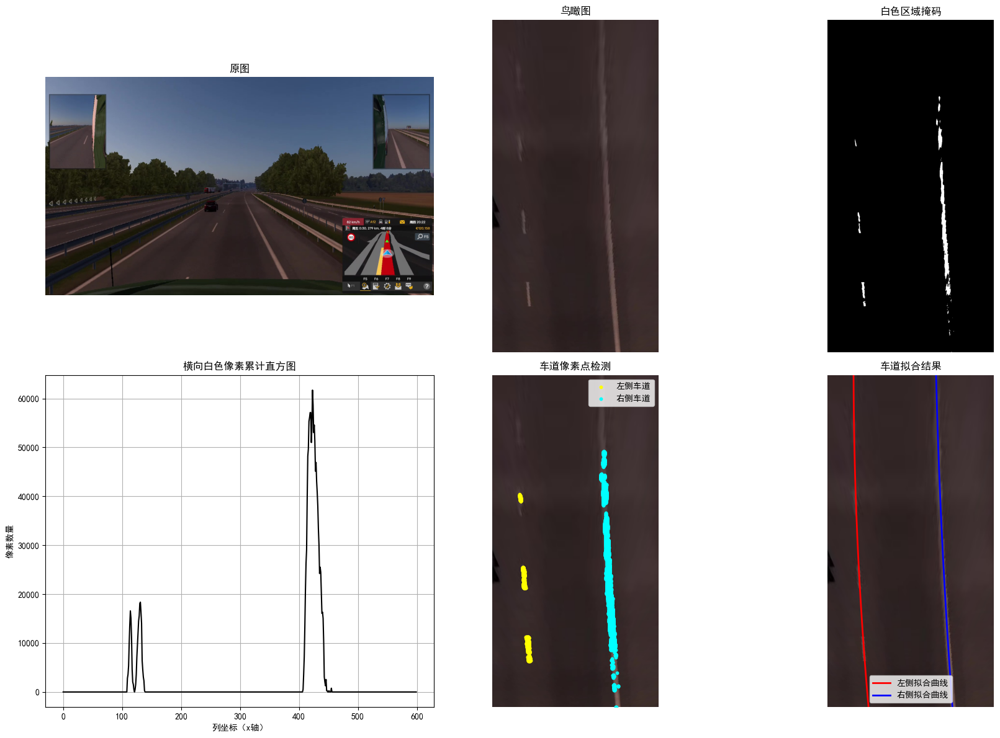

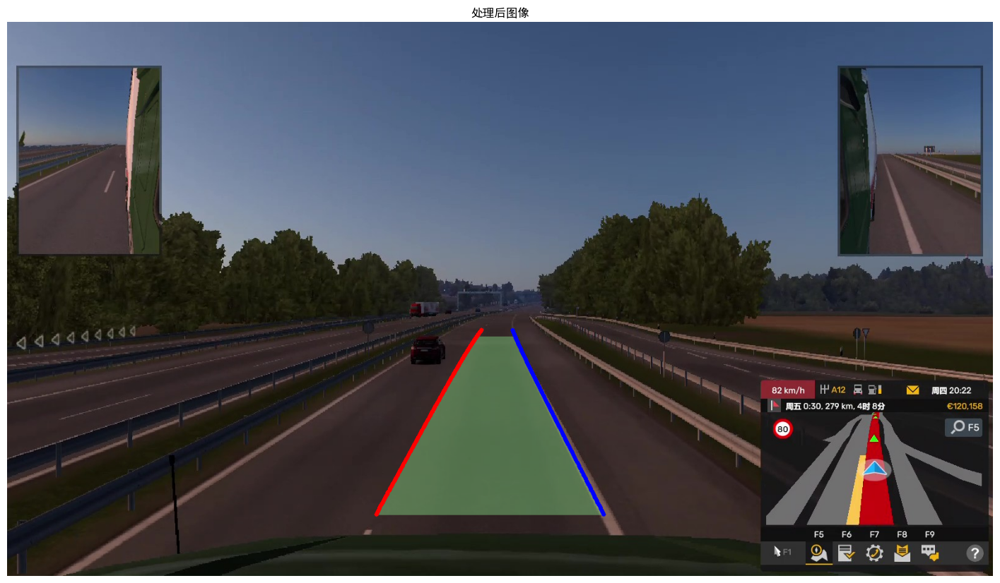

In [12]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置 matplotlib 支持中文和更大图像尺寸
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['figure.figsize'] = (18, 12)

# 1. 加载图像
img = cv2.imread('.\\test\\Euro Truck Simulator 2 2025-04-09 22-28-16 - frame at 1m56s.jpg')
# 转为 RGB 格式用于 matplotlib 显示
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. 定义透视变换区域（源点）
src_pts = np.float32([
    [755, 500],   # 左上角
    [855, 500],   # 右上角
    [1150, 800],  # 右下角
    [420, 800]    # 左下角
])

# 3. 目标区域的点（目标图尺寸：宽600，高1200）
width, height = 600, 1200
dst_pts = np.float32([
    [0, 0],             # 左上角
    [width - 1, 0],     # 右上角
    [width - 1, height - 1],  # 右下角
    [0, height - 1]     # 左下角
])

# 4. 计算透视变换矩阵并做变换
M = cv2.getPerspectiveTransform(src_pts, dst_pts)
bird_eye = cv2.warpPerspective(img, M, (width, height))
bird_eye_rgb = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2RGB)

# 5. 在鸟瞰图上提取白色区域（可根据实际情况调整 HSV 阈值）
hsv = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2HSV)
lower_white = np.array([0, 0, 85])
upper_white = np.array([180, 60, 255])
white_mask = cv2.inRange(hsv, lower_white, upper_white)

# 6. 定义滑动窗口检测车道像素点的函数（针对虚线，将阈值调整为30）
def seekLane(binary_image, lane_peak_x, sliding_window_num=9, margin=100, min_pixels_threshold=30):
    """
    输入：
        binary_image: 二值化图像（例如白色区域掩码）
        lane_peak_x: 车道起始的峰值 x 坐标（直方图得到）
        sliding_window_num: 将图像划分的窗口数量（自下而上）
        margin: 窗口宽度一半
        min_pixels_threshold: 窗口内重新定位中心的最少像素数
    输出：
        lane_x, lane_y: 车道线上所有白色像素的 x 和 y 坐标
    """
    h, w = binary_image.shape
    nonzero = binary_image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    window_center = lane_peak_x
    sliding_window_height = h // sliding_window_num
    lane_pixel_indexes = []
    
    for i in range(sliding_window_num):
        window_top = h - (i + 1) * sliding_window_height
        window_bottom = h - i * sliding_window_height
        window_left = int(window_center - margin)
        window_right = int(window_center + margin)
        
        window_pixel_indices = ((nonzero_y >= window_top) & (nonzero_y < window_bottom) &
                                (nonzero_x >= window_left) & (nonzero_x < window_right)).nonzero()[0]
        lane_pixel_indexes.append(window_pixel_indices)
        
        # 如果当前窗口内像素数大于设定阈值，则更新窗口中心（取质心）
        if len(window_pixel_indices) > min_pixels_threshold:
            window_center = int(np.mean(nonzero_x[window_pixel_indices]))
    
    if len(lane_pixel_indexes) > 0:
        lane_pixel_indexes = np.concatenate(lane_pixel_indexes)
    else:
        lane_pixel_indexes = np.array([])
    
    lane_x = nonzero_x[lane_pixel_indexes]
    lane_y = nonzero_y[lane_pixel_indexes]
    
    return lane_x, lane_y

# 7. 利用直方图确定左右车道线的初始峰值
histogram = np.sum(white_mask[white_mask.shape[0] // 2:, :], axis=0)
midpoint = histogram.shape[0] // 2
left_lane_peak = np.argmax(histogram[:midpoint])
right_lane_peak = np.argmax(histogram[midpoint:]) + midpoint

# 分别检测左右车道线像素
left_lane_x, left_lane_y = seekLane(white_mask, left_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)
right_lane_x, right_lane_y = seekLane(white_mask, right_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)

# 8. 对左右车道线分别进行二次多项式拟合（以 y 作为自变量，x 为因变量）
plot_y = np.linspace(0, height - 1, height)
left_fit_x, right_fit_x = None, None
if len(left_lane_y) > 0 and len(left_lane_x) > 0:
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fit_poly = np.poly1d(left_fit)
    left_fit_x = left_fit_poly(plot_y)
if len(right_lane_y) > 0 and len(right_lane_x) > 0:
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fit_poly = np.poly1d(right_fit)
    right_fit_x = right_fit_poly(plot_y)

# 9. 将6张图展示在一个2x3的图中
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 子图1：原图
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("原图")
axes[0, 0].axis('off')

# 子图2：鸟瞰图
axes[0, 1].imshow(bird_eye_rgb)
axes[0, 1].set_title("鸟瞰图")
axes[0, 1].axis('off')

# 子图3：白色区域掩码
axes[0, 2].imshow(white_mask, cmap='gray')
axes[0, 2].set_title("白色区域掩码")
axes[0, 2].axis('off')

# 子图4：横向白色像素累计直方图
axes[1, 0].plot(histogram, color='black')
axes[1, 0].set_title("横向白色像素累计直方图")
axes[1, 0].set_xlabel("列坐标（x轴）")
axes[1, 0].set_ylabel("像素数量")
axes[1, 0].grid(True)

# 子图5：车道像素点检测（左右）
axes[1, 1].imshow(bird_eye_rgb)
axes[1, 1].scatter(left_lane_x, left_lane_y, s=10, color='yellow', label='左侧车道')
axes[1, 1].scatter(right_lane_x, right_lane_y, s=10, color='cyan', label='右侧车道')
axes[1, 1].set_title("车道像素点检测")
axes[1, 1].legend()
axes[1, 1].axis('off')

# 子图6：车道拟合结果
axes[1, 2].imshow(bird_eye_rgb)
if left_fit_x is not None:
    axes[1, 2].plot(left_fit_x, plot_y, color='red', linewidth=2, label='左侧拟合曲线')
if right_fit_x is not None:
    axes[1, 2].plot(right_fit_x, plot_y, color='blue', linewidth=2, label='右侧拟合曲线')
axes[1, 2].set_title("车道拟合结果")
axes[1, 2].legend()
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

###############################################################################
# --- 以下代码实现将拟合曲线及两曲线中间的区域（到提取的车道像素最高处）叠加到原图上 ---
###############################################################################

# 10. 计算反透视矩阵（从鸟瞰图到原图）
Minv = cv2.getPerspectiveTransform(dst_pts, src_pts)

# 11. 确定填充区域的上边界：
# 如果左右车道都提取到了像素点，则取二者中 y 值最小的（图中位置最高）
if left_lane_y.size > 0 and right_lane_y.size > 0 and left_fit_x is not None and right_fit_x is not None:
    y_top_candidate = min(np.min(left_lane_y), np.min(right_lane_y))
    y_fill_top = int(y_top_candidate)
else:
    # 若某一侧检测失败，则全幅填充（或者自行设定一个阈值）
    y_fill_top = 0

# 12. 在鸟瞰图中构造用于填充区域的多边形：
# 取 y 从 y_fill_top 到底部的区域
fill_y = np.arange(y_fill_top, height)
if left_fit_x is not None:
    left_x_fill = left_fit_poly(fill_y)
if right_fit_x is not None:
    right_x_fill = right_fit_poly(fill_y)

# 左侧曲线点（按 y 从上到下排列）
left_points = np.column_stack((left_x_fill, fill_y))
# 右侧曲线点（按 y 从上到下排列），为了构成闭合多边形，将其翻转
right_points = np.column_stack((right_x_fill, fill_y))[::-1]
# 合并两侧点，构成闭合多边形
polygon_points_be = np.vstack((left_points, right_points))
# 转换为适用于 cv2.perspectiveTransform 的格式
polygon_points_be = polygon_points_be.astype(np.float32).reshape(-1, 1, 2)

# 13. 将多边形区域的点由鸟瞰图坐标转换回原图坐标
polygon_points_orig = cv2.perspectiveTransform(polygon_points_be, Minv)
polygon_points_orig = np.int32(polygon_points_orig)

# 14. 同理，将整条拟合曲线转换到原图：
# 构造整条曲线的点（鸟瞰图坐标下），使用之前的 plot_y 及拟合曲线数据
if left_fit_x is not None:
    left_curve_be = np.column_stack((left_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    left_curve_orig = cv2.perspectiveTransform(left_curve_be, Minv)
    left_curve_orig = left_curve_orig.astype(np.int32)
if right_fit_x is not None:
    right_curve_be = np.column_stack((right_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    right_curve_orig = cv2.perspectiveTransform(right_curve_be, Minv)
    right_curve_orig = right_curve_orig.astype(np.int32)

# 15. 在原图上叠加透明填充和拟合曲线：
# 复制原图用于绘制
img_overlay = img_rgb.copy()

# 创建一个 overlay，用于绘制透明区域
overlay = img_overlay.copy()
alpha = 0.4  # 设置透明度

# 填充多边形区域为透明浅绿色（此处颜色为 (144,238,144) 可根据需要调整）
cv2.fillPoly(overlay, [polygon_points_orig], (144, 238, 144))
# 将 overlay 叠加到原图上
img_overlay = cv2.addWeighted(overlay, alpha, img_overlay, 1 - alpha, 0)

# 绘制左右拟合曲线
if left_fit_x is not None:
    cv2.polylines(img_overlay, [left_curve_orig], isClosed=False, color=(255, 0, 0), thickness=5)
if right_fit_x is not None:
    cv2.polylines(img_overlay, [right_curve_orig], isClosed=False, color=(0, 0, 255), thickness=5)

# 16. 在新窗口中显示结果（原图上叠加了拟合曲线和车道区域）
plt.figure(figsize=(18, 12))
plt.imshow(img_overlay)
plt.title("处理后图像")
plt.axis('off')
plt.show()

### 夜间-隧道-表现差

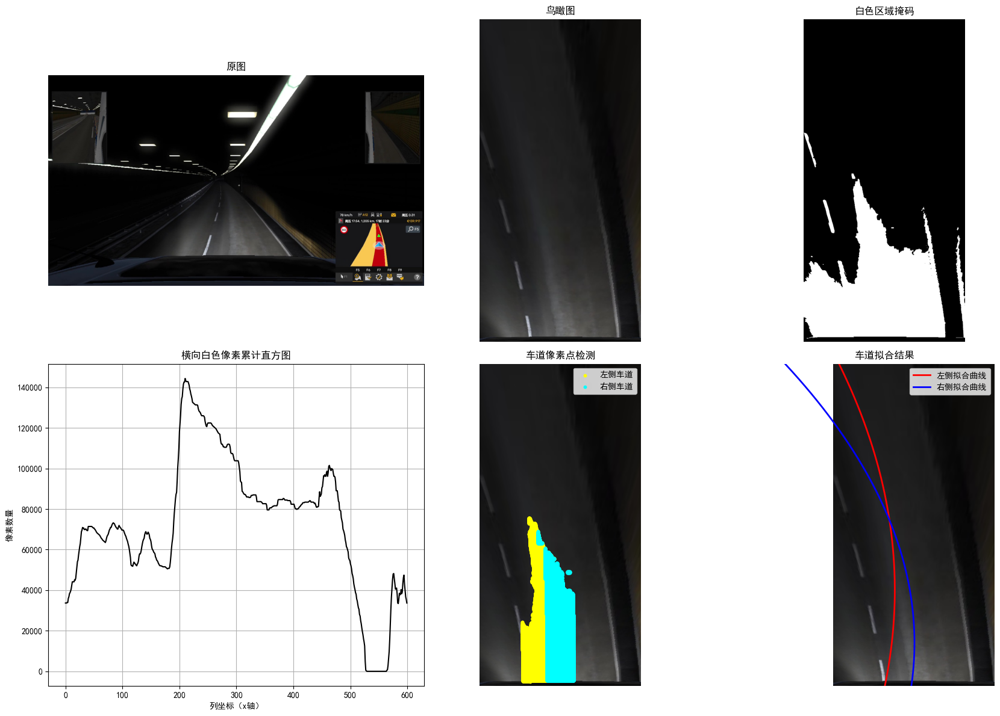

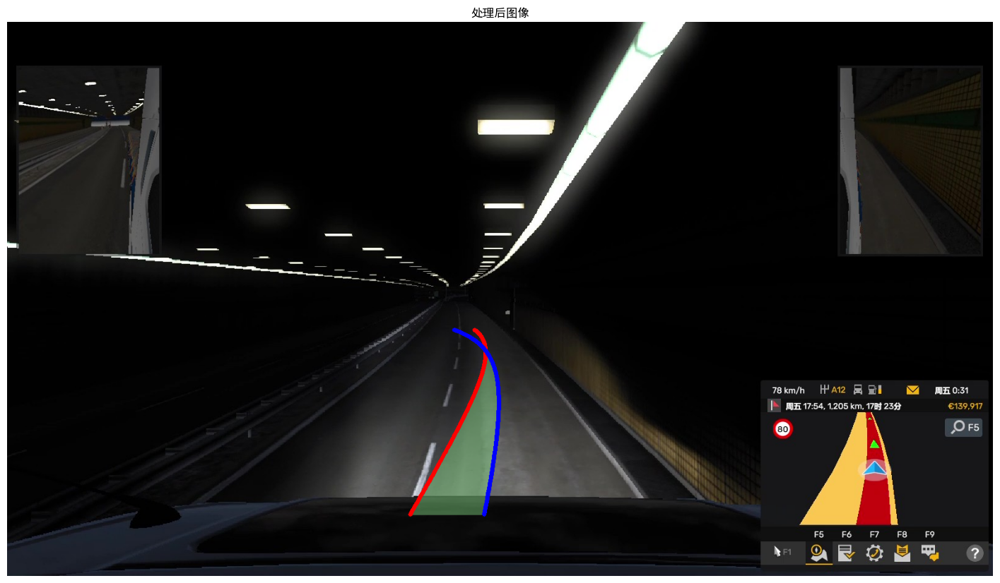

In [34]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置 matplotlib 支持中文和更大图像尺寸
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['figure.figsize'] = (18, 12)

# 1. 加载图像
img = cv2.imread('.\\test\\Euro Truck Simulator 2 2025-04-11 22-32-10 - frame at 1m52s.jpg')
# 转为 RGB 格式用于 matplotlib 显示
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. 定义透视变换区域（源点）
src_pts = np.float32([
    [755, 500],   # 左上角
    [855, 500],   # 右上角
    [1150, 800],  # 右下角
    [420, 800]    # 左下角
])

# 3. 目标区域的点（目标图尺寸：宽600，高1200）
width, height = 600, 1200
dst_pts = np.float32([
    [0, 0],             # 左上角
    [width - 1, 0],     # 右上角
    [width - 1, height - 1],  # 右下角
    [0, height - 1]     # 左下角
])

# 4. 计算透视变换矩阵并做变换
M = cv2.getPerspectiveTransform(src_pts, dst_pts)
bird_eye = cv2.warpPerspective(img, M, (width, height))
bird_eye_rgb = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2RGB)

# 5. 在鸟瞰图上提取白色区域（可根据实际情况调整 HSV 阈值）
hsv = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2HSV)
lower_white = np.array([0, 0, 40])
upper_white = np.array([180, 60, 255])
white_mask = cv2.inRange(hsv, lower_white, upper_white)

# 6. 定义滑动窗口检测车道像素点的函数（针对虚线，将阈值调整为30）
def seekLane(binary_image, lane_peak_x, sliding_window_num=9, margin=100, min_pixels_threshold=30):
    """
    输入：
        binary_image: 二值化图像（例如白色区域掩码）
        lane_peak_x: 车道起始的峰值 x 坐标（直方图得到）
        sliding_window_num: 将图像划分的窗口数量（自下而上）
        margin: 窗口宽度一半
        min_pixels_threshold: 窗口内重新定位中心的最少像素数
    输出：
        lane_x, lane_y: 车道线上所有白色像素的 x 和 y 坐标
    """
    h, w = binary_image.shape
    nonzero = binary_image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    window_center = lane_peak_x
    sliding_window_height = h // sliding_window_num
    lane_pixel_indexes = []
    
    for i in range(sliding_window_num):
        window_top = h - (i + 1) * sliding_window_height
        window_bottom = h - i * sliding_window_height
        window_left = int(window_center - margin)
        window_right = int(window_center + margin)
        
        window_pixel_indices = ((nonzero_y >= window_top) & (nonzero_y < window_bottom) &
                                (nonzero_x >= window_left) & (nonzero_x < window_right)).nonzero()[0]
        lane_pixel_indexes.append(window_pixel_indices)
        
        # 如果当前窗口内像素数大于设定阈值，则更新窗口中心（取质心）
        if len(window_pixel_indices) > min_pixels_threshold:
            window_center = int(np.mean(nonzero_x[window_pixel_indices]))
    
    if len(lane_pixel_indexes) > 0:
        lane_pixel_indexes = np.concatenate(lane_pixel_indexes)
    else:
        lane_pixel_indexes = np.array([])
    
    lane_x = nonzero_x[lane_pixel_indexes]
    lane_y = nonzero_y[lane_pixel_indexes]
    
    return lane_x, lane_y

# 7. 利用直方图确定左右车道线的初始峰值
histogram = np.sum(white_mask[white_mask.shape[0] // 2:, :], axis=0)
midpoint = histogram.shape[0] // 2
left_lane_peak = np.argmax(histogram[:midpoint])
right_lane_peak = np.argmax(histogram[midpoint:]) + midpoint

# 分别检测左右车道线像素
left_lane_x, left_lane_y = seekLane(white_mask, left_lane_peak, sliding_window_num=9, margin=50, min_pixels_threshold=30)
right_lane_x, right_lane_y = seekLane(white_mask, right_lane_peak, sliding_window_num=9, margin=50, min_pixels_threshold=30)

# 8. 对左右车道线分别进行二次多项式拟合（以 y 作为自变量，x 为因变量）
plot_y = np.linspace(0, height - 1, height)
left_fit_x, right_fit_x = None, None
if len(left_lane_y) > 0 and len(left_lane_x) > 0:
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fit_poly = np.poly1d(left_fit)
    left_fit_x = left_fit_poly(plot_y)
if len(right_lane_y) > 0 and len(right_lane_x) > 0:
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fit_poly = np.poly1d(right_fit)
    right_fit_x = right_fit_poly(plot_y)

# 9. 将6张图展示在一个2x3的图中
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 子图1：原图
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("原图")
axes[0, 0].axis('off')

# 子图2：鸟瞰图
axes[0, 1].imshow(bird_eye_rgb)
axes[0, 1].set_title("鸟瞰图")
axes[0, 1].axis('off')

# 子图3：白色区域掩码
axes[0, 2].imshow(white_mask, cmap='gray')
axes[0, 2].set_title("白色区域掩码")
axes[0, 2].axis('off')

# 子图4：横向白色像素累计直方图
axes[1, 0].plot(histogram, color='black')
axes[1, 0].set_title("横向白色像素累计直方图")
axes[1, 0].set_xlabel("列坐标（x轴）")
axes[1, 0].set_ylabel("像素数量")
axes[1, 0].grid(True)

# 子图5：车道像素点检测（左右）
axes[1, 1].imshow(bird_eye_rgb)
axes[1, 1].scatter(left_lane_x, left_lane_y, s=10, color='yellow', label='左侧车道')
axes[1, 1].scatter(right_lane_x, right_lane_y, s=10, color='cyan', label='右侧车道')
axes[1, 1].set_title("车道像素点检测")
axes[1, 1].legend()
axes[1, 1].axis('off')

# 子图6：车道拟合结果
axes[1, 2].imshow(bird_eye_rgb)
if left_fit_x is not None:
    axes[1, 2].plot(left_fit_x, plot_y, color='red', linewidth=2, label='左侧拟合曲线')
if right_fit_x is not None:
    axes[1, 2].plot(right_fit_x, plot_y, color='blue', linewidth=2, label='右侧拟合曲线')
axes[1, 2].set_title("车道拟合结果")
axes[1, 2].legend()
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

###############################################################################
# --- 以下代码实现将拟合曲线及两曲线中间的区域（到提取的车道像素最高处）叠加到原图上 ---
###############################################################################

# 10. 计算反透视矩阵（从鸟瞰图到原图）
Minv = cv2.getPerspectiveTransform(dst_pts, src_pts)

# 11. 确定填充区域的上边界：
# 如果左右车道都提取到了像素点，则取二者中 y 值最小的（图中位置最高）
if left_lane_y.size > 0 and right_lane_y.size > 0 and left_fit_x is not None and right_fit_x is not None:
    y_top_candidate = min(np.min(left_lane_y), np.min(right_lane_y))
    y_fill_top = int(y_top_candidate)
else:
    # 若某一侧检测失败，则全幅填充（或者自行设定一个阈值）
    y_fill_top = 0

# 12. 在鸟瞰图中构造用于填充区域的多边形：
# 取 y 从 y_fill_top 到底部的区域
fill_y = np.arange(y_fill_top, height)
if left_fit_x is not None:
    left_x_fill = left_fit_poly(fill_y)
if right_fit_x is not None:
    right_x_fill = right_fit_poly(fill_y)

# 左侧曲线点（按 y 从上到下排列）
left_points = np.column_stack((left_x_fill, fill_y))
# 右侧曲线点（按 y 从上到下排列），为了构成闭合多边形，将其翻转
right_points = np.column_stack((right_x_fill, fill_y))[::-1]
# 合并两侧点，构成闭合多边形
polygon_points_be = np.vstack((left_points, right_points))
# 转换为适用于 cv2.perspectiveTransform 的格式
polygon_points_be = polygon_points_be.astype(np.float32).reshape(-1, 1, 2)

# 13. 将多边形区域的点由鸟瞰图坐标转换回原图坐标
polygon_points_orig = cv2.perspectiveTransform(polygon_points_be, Minv)
polygon_points_orig = np.int32(polygon_points_orig)

# 14. 同理，将整条拟合曲线转换到原图：
# 构造整条曲线的点（鸟瞰图坐标下），使用之前的 plot_y 及拟合曲线数据
if left_fit_x is not None:
    left_curve_be = np.column_stack((left_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    left_curve_orig = cv2.perspectiveTransform(left_curve_be, Minv)
    left_curve_orig = left_curve_orig.astype(np.int32)
if right_fit_x is not None:
    right_curve_be = np.column_stack((right_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    right_curve_orig = cv2.perspectiveTransform(right_curve_be, Minv)
    right_curve_orig = right_curve_orig.astype(np.int32)

# 15. 在原图上叠加透明填充和拟合曲线：
# 复制原图用于绘制
img_overlay = img_rgb.copy()

# 创建一个 overlay，用于绘制透明区域
overlay = img_overlay.copy()
alpha = 0.4  # 设置透明度

# 填充多边形区域为透明浅绿色（此处颜色为 (144,238,144) 可根据需要调整）
cv2.fillPoly(overlay, [polygon_points_orig], (144, 238, 144))
# 将 overlay 叠加到原图上
img_overlay = cv2.addWeighted(overlay, alpha, img_overlay, 1 - alpha, 0)

# 绘制左右拟合曲线
if left_fit_x is not None:
    cv2.polylines(img_overlay, [left_curve_orig], isClosed=False, color=(255, 0, 0), thickness=5)
if right_fit_x is not None:
    cv2.polylines(img_overlay, [right_curve_orig], isClosed=False, color=(0, 0, 255), thickness=5)

# 16. 在新窗口中显示结果（原图上叠加了拟合曲线和车道区域）
plt.figure(figsize=(18, 12))
plt.imshow(img_overlay)
plt.title("处理后图像")
plt.axis('off')
plt.show()

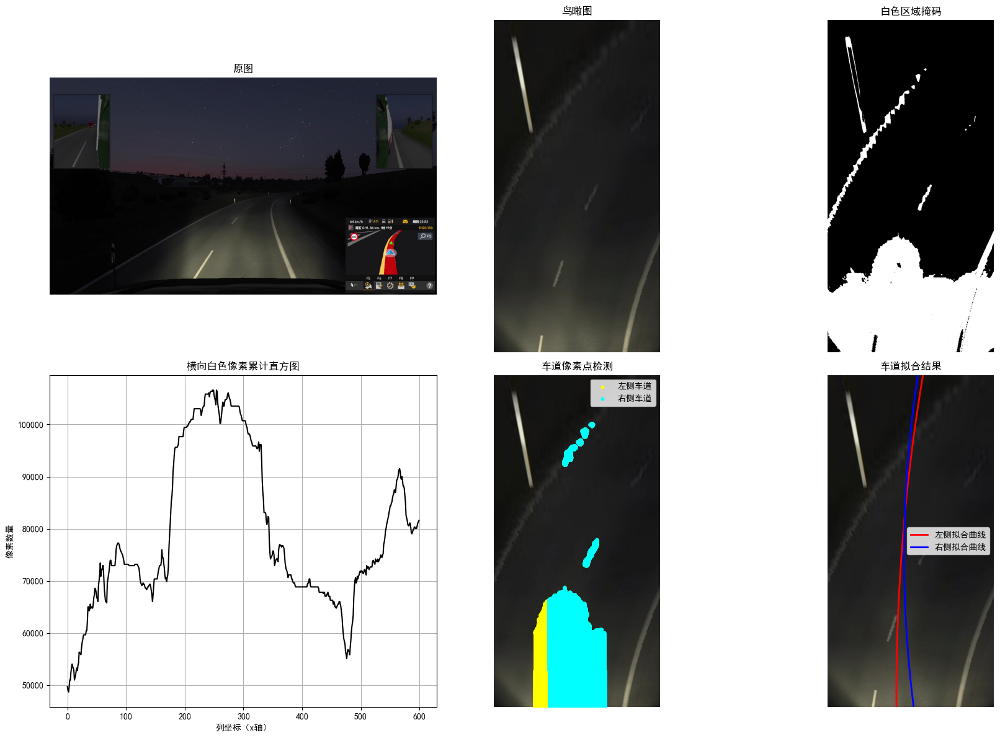

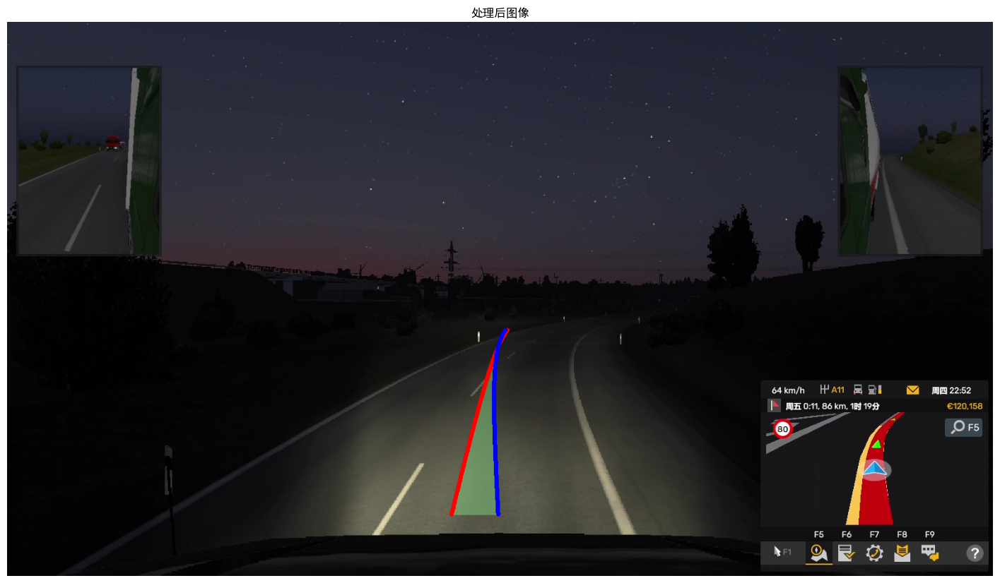

In [44]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置 matplotlib 支持中文和更大图像尺寸
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['figure.figsize'] = (18, 12)

# 1. 加载图像
img = cv2.imread('.\\test\\Euro Truck Simulator 2 2025-04-11 22-18-41 - frame at 0m3s.jpg')
# 转为 RGB 格式用于 matplotlib 显示
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. 定义透视变换区域（源点）
src_pts = np.float32([
    [755, 500],   # 左上角
    [855, 500],   # 右上角
    [1150, 800],  # 右下角
    [420, 800]    # 左下角
])

# 3. 目标区域的点（目标图尺寸：宽600，高1200）
width, height = 600, 1200
dst_pts = np.float32([
    [0, 0],             # 左上角
    [width - 1, 0],     # 右上角
    [width - 1, height - 1],  # 右下角
    [0, height - 1]     # 左下角
])

# 4. 计算透视变换矩阵并做变换
M = cv2.getPerspectiveTransform(src_pts, dst_pts)
bird_eye = cv2.warpPerspective(img, M, (width, height))
bird_eye_rgb = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2RGB)

# 5. 在鸟瞰图上提取白色区域（可根据实际情况调整 HSV 阈值）
hsv = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2HSV)
lower_white = np.array([0, 0, 40])
upper_white = np.array([180, 60, 150])
white_mask = cv2.inRange(hsv, lower_white, upper_white)

# 6. 定义滑动窗口检测车道像素点的函数（针对虚线，将阈值调整为30）
def seekLane(binary_image, lane_peak_x, sliding_window_num=9, margin=100, min_pixels_threshold=30):
    """
    输入：
        binary_image: 二值化图像（例如白色区域掩码）
        lane_peak_x: 车道起始的峰值 x 坐标（直方图得到）
        sliding_window_num: 将图像划分的窗口数量（自下而上）
        margin: 窗口宽度一半
        min_pixels_threshold: 窗口内重新定位中心的最少像素数
    输出：
        lane_x, lane_y: 车道线上所有白色像素的 x 和 y 坐标
    """
    h, w = binary_image.shape
    nonzero = binary_image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    window_center = lane_peak_x
    sliding_window_height = h // sliding_window_num
    lane_pixel_indexes = []
    
    for i in range(sliding_window_num):
        window_top = h - (i + 1) * sliding_window_height
        window_bottom = h - i * sliding_window_height
        window_left = int(window_center - margin)
        window_right = int(window_center + margin)
        
        window_pixel_indices = ((nonzero_y >= window_top) & (nonzero_y < window_bottom) &
                                (nonzero_x >= window_left) & (nonzero_x < window_right)).nonzero()[0]
        lane_pixel_indexes.append(window_pixel_indices)
        
        # 如果当前窗口内像素数大于设定阈值，则更新窗口中心（取质心）
        if len(window_pixel_indices) > min_pixels_threshold:
            window_center = int(np.mean(nonzero_x[window_pixel_indices]))
    
    if len(lane_pixel_indexes) > 0:
        lane_pixel_indexes = np.concatenate(lane_pixel_indexes)
    else:
        lane_pixel_indexes = np.array([])
    
    lane_x = nonzero_x[lane_pixel_indexes]
    lane_y = nonzero_y[lane_pixel_indexes]
    
    return lane_x, lane_y

# 7. 利用直方图确定左右车道线的初始峰值
histogram = np.sum(white_mask[white_mask.shape[0] // 2:, :], axis=0)
midpoint = histogram.shape[0] // 2
left_lane_peak = np.argmax(histogram[:midpoint])
right_lane_peak = np.argmax(histogram[midpoint:]) + midpoint

# 分别检测左右车道线像素
left_lane_x, left_lane_y = seekLane(white_mask, left_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)
right_lane_x, right_lane_y = seekLane(white_mask, right_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)

# 8. 对左右车道线分别进行二次多项式拟合（以 y 作为自变量，x 为因变量）
plot_y = np.linspace(0, height - 1, height)
left_fit_x, right_fit_x = None, None
if len(left_lane_y) > 0 and len(left_lane_x) > 0:
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fit_poly = np.poly1d(left_fit)
    left_fit_x = left_fit_poly(plot_y)
if len(right_lane_y) > 0 and len(right_lane_x) > 0:
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fit_poly = np.poly1d(right_fit)
    right_fit_x = right_fit_poly(plot_y)

# 9. 将6张图展示在一个2x3的图中
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 子图1：原图
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("原图")
axes[0, 0].axis('off')

# 子图2：鸟瞰图
axes[0, 1].imshow(bird_eye_rgb)
axes[0, 1].set_title("鸟瞰图")
axes[0, 1].axis('off')

# 子图3：白色区域掩码
axes[0, 2].imshow(white_mask, cmap='gray')
axes[0, 2].set_title("白色区域掩码")
axes[0, 2].axis('off')

# 子图4：横向白色像素累计直方图
axes[1, 0].plot(histogram, color='black')
axes[1, 0].set_title("横向白色像素累计直方图")
axes[1, 0].set_xlabel("列坐标（x轴）")
axes[1, 0].set_ylabel("像素数量")
axes[1, 0].grid(True)

# 子图5：车道像素点检测（左右）
axes[1, 1].imshow(bird_eye_rgb)
axes[1, 1].scatter(left_lane_x, left_lane_y, s=10, color='yellow', label='左侧车道')
axes[1, 1].scatter(right_lane_x, right_lane_y, s=10, color='cyan', label='右侧车道')
axes[1, 1].set_title("车道像素点检测")
axes[1, 1].legend()
axes[1, 1].axis('off')

# 子图6：车道拟合结果
axes[1, 2].imshow(bird_eye_rgb)
if left_fit_x is not None:
    axes[1, 2].plot(left_fit_x, plot_y, color='red', linewidth=2, label='左侧拟合曲线')
if right_fit_x is not None:
    axes[1, 2].plot(right_fit_x, plot_y, color='blue', linewidth=2, label='右侧拟合曲线')
axes[1, 2].set_title("车道拟合结果")
axes[1, 2].legend()
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

###############################################################################
# --- 以下代码实现将拟合曲线及两曲线中间的区域（到提取的车道像素最高处）叠加到原图上 ---
###############################################################################

# 10. 计算反透视矩阵（从鸟瞰图到原图）
Minv = cv2.getPerspectiveTransform(dst_pts, src_pts)

# 11. 确定填充区域的上边界：
# 如果左右车道都提取到了像素点，则取二者中 y 值最小的（图中位置最高）
if left_lane_y.size > 0 and right_lane_y.size > 0 and left_fit_x is not None and right_fit_x is not None:
    y_top_candidate = min(np.min(left_lane_y), np.min(right_lane_y))
    y_fill_top = int(y_top_candidate)
else:
    # 若某一侧检测失败，则全幅填充（或者自行设定一个阈值）
    y_fill_top = 0

# 12. 在鸟瞰图中构造用于填充区域的多边形：
# 取 y 从 y_fill_top 到底部的区域
fill_y = np.arange(y_fill_top, height)
if left_fit_x is not None:
    left_x_fill = left_fit_poly(fill_y)
if right_fit_x is not None:
    right_x_fill = right_fit_poly(fill_y)

# 左侧曲线点（按 y 从上到下排列）
left_points = np.column_stack((left_x_fill, fill_y))
# 右侧曲线点（按 y 从上到下排列），为了构成闭合多边形，将其翻转
right_points = np.column_stack((right_x_fill, fill_y))[::-1]
# 合并两侧点，构成闭合多边形
polygon_points_be = np.vstack((left_points, right_points))
# 转换为适用于 cv2.perspectiveTransform 的格式
polygon_points_be = polygon_points_be.astype(np.float32).reshape(-1, 1, 2)

# 13. 将多边形区域的点由鸟瞰图坐标转换回原图坐标
polygon_points_orig = cv2.perspectiveTransform(polygon_points_be, Minv)
polygon_points_orig = np.int32(polygon_points_orig)

# 14. 同理，将整条拟合曲线转换到原图：
# 构造整条曲线的点（鸟瞰图坐标下），使用之前的 plot_y 及拟合曲线数据
if left_fit_x is not None:
    left_curve_be = np.column_stack((left_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    left_curve_orig = cv2.perspectiveTransform(left_curve_be, Minv)
    left_curve_orig = left_curve_orig.astype(np.int32)
if right_fit_x is not None:
    right_curve_be = np.column_stack((right_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    right_curve_orig = cv2.perspectiveTransform(right_curve_be, Minv)
    right_curve_orig = right_curve_orig.astype(np.int32)

# 15. 在原图上叠加透明填充和拟合曲线：
# 复制原图用于绘制
img_overlay = img_rgb.copy()

# 创建一个 overlay，用于绘制透明区域
overlay = img_overlay.copy()
alpha = 0.4  # 设置透明度

# 填充多边形区域为透明浅绿色（此处颜色为 (144,238,144) 可根据需要调整）
cv2.fillPoly(overlay, [polygon_points_orig], (144, 238, 144))
# 将 overlay 叠加到原图上
img_overlay = cv2.addWeighted(overlay, alpha, img_overlay, 1 - alpha, 0)

# 绘制左右拟合曲线
if left_fit_x is not None:
    cv2.polylines(img_overlay, [left_curve_orig], isClosed=False, color=(255, 0, 0), thickness=5)
if right_fit_x is not None:
    cv2.polylines(img_overlay, [right_curve_orig], isClosed=False, color=(0, 0, 255), thickness=5)

# 16. 在新窗口中显示结果（原图上叠加了拟合曲线和车道区域）
plt.figure(figsize=(18, 12))
plt.imshow(img_overlay)
plt.title("处理后图像")
plt.axis('off')
plt.show()

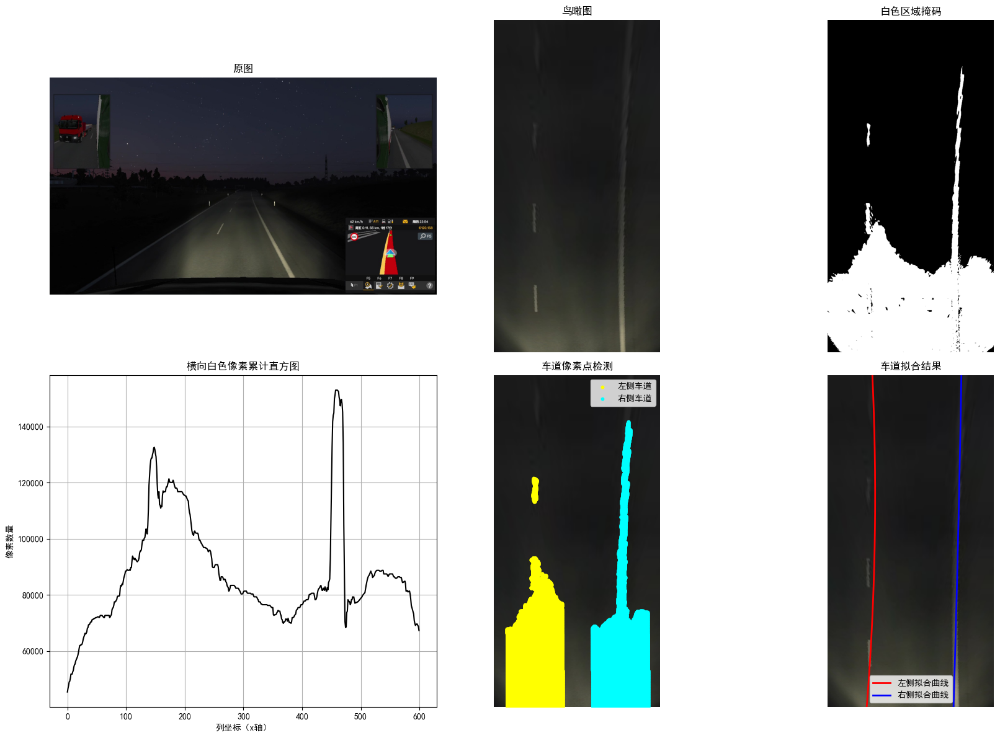

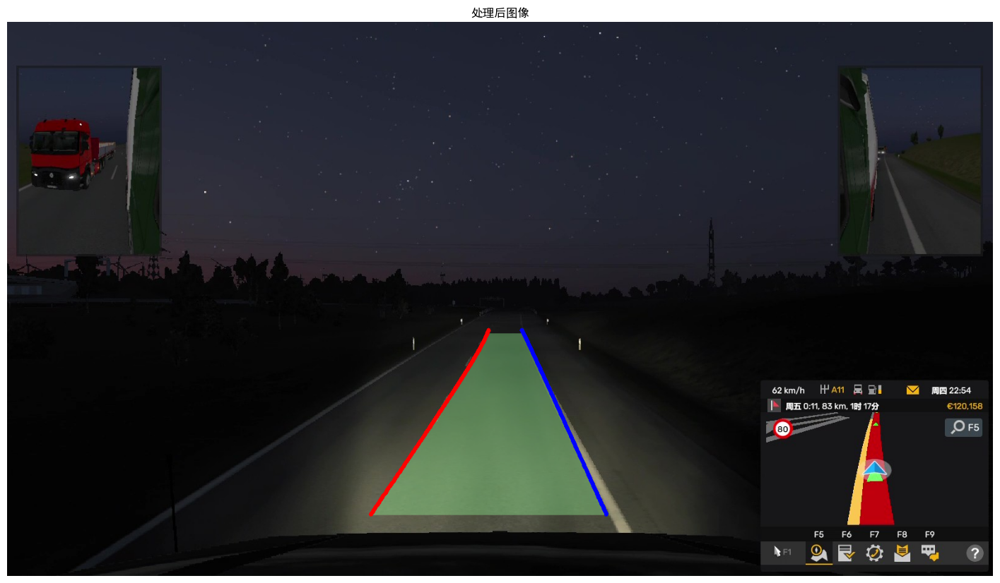

In [43]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# 设置 matplotlib 支持中文和更大图像尺寸
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['figure.figsize'] = (18, 12)

# 1. 加载图像
img = cv2.imread('.\\test\\Euro Truck Simulator 2 2025-04-11 22-18-41 - frame at 0m11s.jpg')
# 转为 RGB 格式用于 matplotlib 显示
img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# 2. 定义透视变换区域（源点）
src_pts = np.float32([
    [755, 500],   # 左上角
    [855, 500],   # 右上角
    [1150, 800],  # 右下角
    [420, 800]    # 左下角
])

# 3. 目标区域的点（目标图尺寸：宽600，高1200）
width, height = 600, 1200
dst_pts = np.float32([
    [0, 0],             # 左上角
    [width - 1, 0],     # 右上角
    [width - 1, height - 1],  # 右下角
    [0, height - 1]     # 左下角
])

# 4. 计算透视变换矩阵并做变换
M = cv2.getPerspectiveTransform(src_pts, dst_pts)
bird_eye = cv2.warpPerspective(img, M, (width, height))
bird_eye_rgb = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2RGB)

# 5. 在鸟瞰图上提取白色区域（可根据实际情况调整 HSV 阈值）
hsv = cv2.cvtColor(bird_eye, cv2.COLOR_BGR2HSV)
lower_white = np.array([0, 0, 40])
upper_white = np.array([180, 60, 200])
white_mask = cv2.inRange(hsv, lower_white, upper_white)

# 6. 定义滑动窗口检测车道像素点的函数（针对虚线，将阈值调整为30）
def seekLane(binary_image, lane_peak_x, sliding_window_num=9, margin=100, min_pixels_threshold=30):
    """
    输入：
        binary_image: 二值化图像（例如白色区域掩码）
        lane_peak_x: 车道起始的峰值 x 坐标（直方图得到）
        sliding_window_num: 将图像划分的窗口数量（自下而上）
        margin: 窗口宽度一半
        min_pixels_threshold: 窗口内重新定位中心的最少像素数
    输出：
        lane_x, lane_y: 车道线上所有白色像素的 x 和 y 坐标
    """
    h, w = binary_image.shape
    nonzero = binary_image.nonzero()
    nonzero_y = np.array(nonzero[0])
    nonzero_x = np.array(nonzero[1])
    
    window_center = lane_peak_x
    sliding_window_height = h // sliding_window_num
    lane_pixel_indexes = []
    
    for i in range(sliding_window_num):
        window_top = h - (i + 1) * sliding_window_height
        window_bottom = h - i * sliding_window_height
        window_left = int(window_center - margin)
        window_right = int(window_center + margin)
        
        window_pixel_indices = ((nonzero_y >= window_top) & (nonzero_y < window_bottom) &
                                (nonzero_x >= window_left) & (nonzero_x < window_right)).nonzero()[0]
        lane_pixel_indexes.append(window_pixel_indices)
        
        # 如果当前窗口内像素数大于设定阈值，则更新窗口中心（取质心）
        if len(window_pixel_indices) > min_pixels_threshold:
            window_center = int(np.mean(nonzero_x[window_pixel_indices]))
    
    if len(lane_pixel_indexes) > 0:
        lane_pixel_indexes = np.concatenate(lane_pixel_indexes)
    else:
        lane_pixel_indexes = np.array([])
    
    lane_x = nonzero_x[lane_pixel_indexes]
    lane_y = nonzero_y[lane_pixel_indexes]
    
    return lane_x, lane_y

# 7. 利用直方图确定左右车道线的初始峰值
histogram = np.sum(white_mask[white_mask.shape[0] // 2:, :], axis=0)
midpoint = histogram.shape[0] // 2
left_lane_peak = np.argmax(histogram[:midpoint])
right_lane_peak = np.argmax(histogram[midpoint:]) + midpoint

# 分别检测左右车道线像素
left_lane_x, left_lane_y = seekLane(white_mask, left_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)
right_lane_x, right_lane_y = seekLane(white_mask, right_lane_peak, sliding_window_num=9, margin=100, min_pixels_threshold=30)

# 8. 对左右车道线分别进行二次多项式拟合（以 y 作为自变量，x 为因变量）
plot_y = np.linspace(0, height - 1, height)
left_fit_x, right_fit_x = None, None
if len(left_lane_y) > 0 and len(left_lane_x) > 0:
    left_fit = np.polyfit(left_lane_y, left_lane_x, 2)
    left_fit_poly = np.poly1d(left_fit)
    left_fit_x = left_fit_poly(plot_y)
if len(right_lane_y) > 0 and len(right_lane_x) > 0:
    right_fit = np.polyfit(right_lane_y, right_lane_x, 2)
    right_fit_poly = np.poly1d(right_fit)
    right_fit_x = right_fit_poly(plot_y)

# 9. 将6张图展示在一个2x3的图中
fig, axes = plt.subplots(2, 3, figsize=(18, 12))

# 子图1：原图
axes[0, 0].imshow(img_rgb)
axes[0, 0].set_title("原图")
axes[0, 0].axis('off')

# 子图2：鸟瞰图
axes[0, 1].imshow(bird_eye_rgb)
axes[0, 1].set_title("鸟瞰图")
axes[0, 1].axis('off')

# 子图3：白色区域掩码
axes[0, 2].imshow(white_mask, cmap='gray')
axes[0, 2].set_title("白色区域掩码")
axes[0, 2].axis('off')

# 子图4：横向白色像素累计直方图
axes[1, 0].plot(histogram, color='black')
axes[1, 0].set_title("横向白色像素累计直方图")
axes[1, 0].set_xlabel("列坐标（x轴）")
axes[1, 0].set_ylabel("像素数量")
axes[1, 0].grid(True)

# 子图5：车道像素点检测（左右）
axes[1, 1].imshow(bird_eye_rgb)
axes[1, 1].scatter(left_lane_x, left_lane_y, s=10, color='yellow', label='左侧车道')
axes[1, 1].scatter(right_lane_x, right_lane_y, s=10, color='cyan', label='右侧车道')
axes[1, 1].set_title("车道像素点检测")
axes[1, 1].legend()
axes[1, 1].axis('off')

# 子图6：车道拟合结果
axes[1, 2].imshow(bird_eye_rgb)
if left_fit_x is not None:
    axes[1, 2].plot(left_fit_x, plot_y, color='red', linewidth=2, label='左侧拟合曲线')
if right_fit_x is not None:
    axes[1, 2].plot(right_fit_x, plot_y, color='blue', linewidth=2, label='右侧拟合曲线')
axes[1, 2].set_title("车道拟合结果")
axes[1, 2].legend()
axes[1, 2].axis('off')

plt.tight_layout()
plt.show()

###############################################################################
# --- 以下代码实现将拟合曲线及两曲线中间的区域（到提取的车道像素最高处）叠加到原图上 ---
###############################################################################

# 10. 计算反透视矩阵（从鸟瞰图到原图）
Minv = cv2.getPerspectiveTransform(dst_pts, src_pts)

# 11. 确定填充区域的上边界：
# 如果左右车道都提取到了像素点，则取二者中 y 值最小的（图中位置最高）
if left_lane_y.size > 0 and right_lane_y.size > 0 and left_fit_x is not None and right_fit_x is not None:
    y_top_candidate = min(np.min(left_lane_y), np.min(right_lane_y))
    y_fill_top = int(y_top_candidate)
else:
    # 若某一侧检测失败，则全幅填充（或者自行设定一个阈值）
    y_fill_top = 0

# 12. 在鸟瞰图中构造用于填充区域的多边形：
# 取 y 从 y_fill_top 到底部的区域
fill_y = np.arange(y_fill_top, height)
if left_fit_x is not None:
    left_x_fill = left_fit_poly(fill_y)
if right_fit_x is not None:
    right_x_fill = right_fit_poly(fill_y)

# 左侧曲线点（按 y 从上到下排列）
left_points = np.column_stack((left_x_fill, fill_y))
# 右侧曲线点（按 y 从上到下排列），为了构成闭合多边形，将其翻转
right_points = np.column_stack((right_x_fill, fill_y))[::-1]
# 合并两侧点，构成闭合多边形
polygon_points_be = np.vstack((left_points, right_points))
# 转换为适用于 cv2.perspectiveTransform 的格式
polygon_points_be = polygon_points_be.astype(np.float32).reshape(-1, 1, 2)

# 13. 将多边形区域的点由鸟瞰图坐标转换回原图坐标
polygon_points_orig = cv2.perspectiveTransform(polygon_points_be, Minv)
polygon_points_orig = np.int32(polygon_points_orig)

# 14. 同理，将整条拟合曲线转换到原图：
# 构造整条曲线的点（鸟瞰图坐标下），使用之前的 plot_y 及拟合曲线数据
if left_fit_x is not None:
    left_curve_be = np.column_stack((left_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    left_curve_orig = cv2.perspectiveTransform(left_curve_be, Minv)
    left_curve_orig = left_curve_orig.astype(np.int32)
if right_fit_x is not None:
    right_curve_be = np.column_stack((right_fit_x, plot_y)).astype(np.float32).reshape(-1, 1, 2)
    right_curve_orig = cv2.perspectiveTransform(right_curve_be, Minv)
    right_curve_orig = right_curve_orig.astype(np.int32)

# 15. 在原图上叠加透明填充和拟合曲线：
# 复制原图用于绘制
img_overlay = img_rgb.copy()

# 创建一个 overlay，用于绘制透明区域
overlay = img_overlay.copy()
alpha = 0.4  # 设置透明度

# 填充多边形区域为透明浅绿色（此处颜色为 (144,238,144) 可根据需要调整）
cv2.fillPoly(overlay, [polygon_points_orig], (144, 238, 144))
# 将 overlay 叠加到原图上
img_overlay = cv2.addWeighted(overlay, alpha, img_overlay, 1 - alpha, 0)

# 绘制左右拟合曲线
if left_fit_x is not None:
    cv2.polylines(img_overlay, [left_curve_orig], isClosed=False, color=(255, 0, 0), thickness=5)
if right_fit_x is not None:
    cv2.polylines(img_overlay, [right_curve_orig], isClosed=False, color=(0, 0, 255), thickness=5)

# 16. 在新窗口中显示结果（原图上叠加了拟合曲线和车道区域）
plt.figure(figsize=(18, 12))
plt.imshow(img_overlay)
plt.title("处理后图像")
plt.axis('off')
plt.show()